# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 27

**Author 1 (sciper):** Zhuoran Ren (xxxxx)  
**Author 2 (sciper):** Nivedya Suresh Nambiar (388049)   
**Author 3 (sciper):** Dana Shayakhmetova (388763)   

**Release date:** 05.03.2025   
**Due date:** 19.03.2025 (11:59 pm)


## Key Submission Guidelines:
- **Before submitting your notebook, <span style="color:red;">rerun</span> it from scratch!** Go to: `Kernel` > `Restart & Run All`  
- **Only groups of three will be accepted**, except in exceptional circumstances.  
- **You are not allowed to use any libraries** other than those provided in this notebook.  
- **Failure to follow these guidelines may result in point deductions** during grading.  


[iapr]: https://github.com/LTS5/iapr2025

In [1]:
# Check is at least python 3.9
import sys 
assert (sys.version_info.major == 3) and (sys.version_info.minor == 12)

In [2]:
# Install required packages
!pip install numpy -q
!pip install matplotlib -q
!pip install scikit-image -q
!pip install pillow -q

In [3]:
# Import main packages
from utils.lab_01_utils import *
from skimage.color import rgb2hsv
from skimage.morphology import closing, opening, disk, remove_small_holes, remove_small_objects, binary_dilation

---
# Introduction


In this lab, we will be working with histological data. Histological images are created from tissue samples that are digitized using high-resolution scanners. Without preparation, human tissues lack visual contrast and have poor tissue differentiations. To overcome this issue, clinical institutes use chemical staining to artificially enhance contrast. The most famous one is called HE (hematoxylin and eosin) staining. Hematoxylin stains tissue nuclei with a deep purple while eosin focuses more on extracellular matrix components with a pink stain.

Before running the following code make sure that the images are located as follows:

```code
├── labs
|   ├── utils
|   |   └── lab_01_utils.py
|   └── lab_01_iapr.ipynb
└── data
    └── data_lab_01
        ├── tcga_crc_example.png
        └── tcga_blood_example.png
```
**⚠️ DO NOT CHANGE THIS CONFIGURATION, AS WE WILL RERUN YOUR NOTEBOOK USING THIS EXACT STRUCTURE!**

By running the following cells you will display a HE histological sample of a colorectal cancer case. It is composed of 3 main entities:
* **Mucin**: Grayish mucus that is secreted by the body. The presence of a tumor tends to increase its presence. 
* **Tumor**: Dark purple aggregates (hematoxylin). Mainly composed of cancerous cells.
* **Other**: Mixture of other cells such as stromal or lymphocytes. It appears mainly pink (eosin) but is dotted with nuclei (purple).

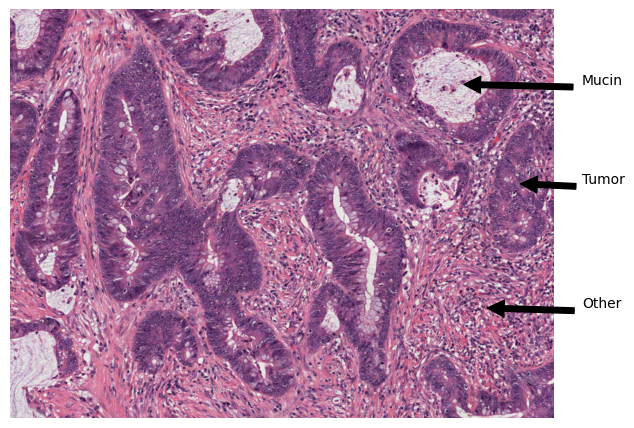

In [4]:
img_he = show_introduction_figure()


# Part 1 - Segmentation [16 pts]

## Part 1.1 - RGB (3 pts)

**Q1 (1 pts)**: In this section, you will have to complete the function `extract_rgb_channels`. The function should extract and return red, blue, and green channels from the input image `img`. Your function will be fed to `plot_colors_histo` to plot the distribution of the colors in the image. 

In [5]:
def extract_rgb_channels(img):
    """
    Extract RGB channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_red: np.ndarray (M, N)
        Red channel of input image
    data_green: np.ndarray (M, N)
        Green channel of input image
    data_blue: np.ndarray (M, N)
        Blue channel of input image
    """

    # Get the shape of the input image
    M, N, _ = np.shape(img)

    # Define default values for RGB channels
    data_red = np.zeros((M, N))
    data_green = np.zeros((M, N))
    data_blue = np.zeros((M, N))

    # ------------------
    data_red = img[:,:,0]
    data_green = img[:,:,1]
    data_blue = img[:,:,2]
    # ------------------
    
    return data_red, data_green, data_blue

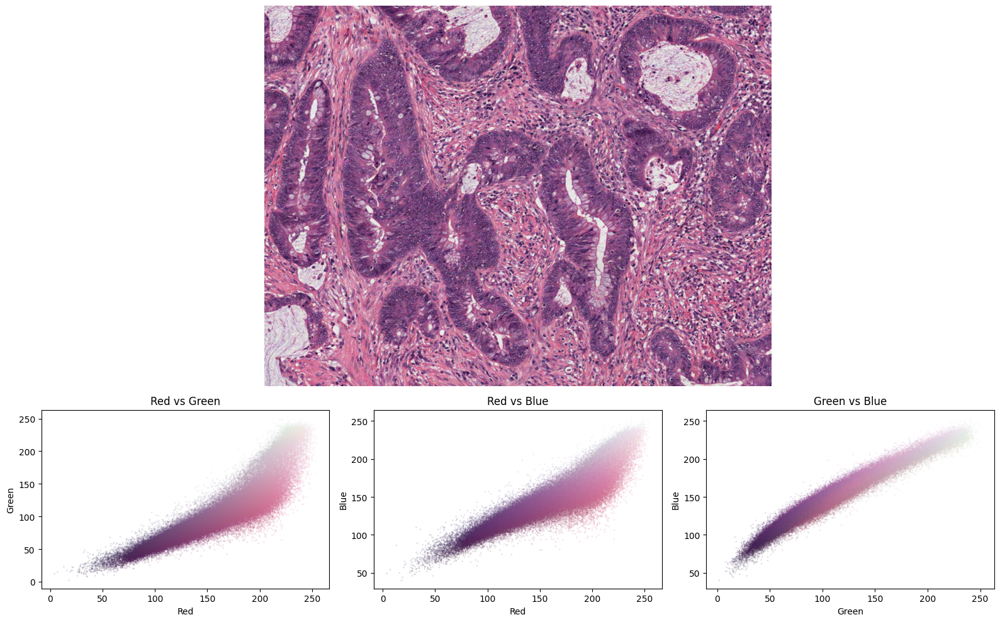

In [6]:
################################################################
############################ TEST ##############################
################################################################

plot_colors_histo(
    img = img_he,
    func = extract_rgb_channels,
    labels = ["Red", "Green", "Blue"],
)

Based on the result of the plot above

* **Q2 (1 pts)**: Do you think you can find a simple manual thresholding approach to isolate the tumor components? (Justify)
    * **Answer**: Yes, we can use a simple manual thresholding approach based on the color of the different componenents in order to segment the image. We know that the tumor components are purple in color while the others are grey or pink. If we choose the pixels that have 'high' values in both the red and blue channels, coincident with a 'low' value in the green channel, we can pick the pixels of the image that are purple and therefore belong to the tumor. However there are also pink pixels which have a 'high' value in the red channel along with relatively 'low' value in the blue channels. The definition of 'high' vs 'low' are defined by our manual thresholding technique, described in Q3.
* **Q3 (1 pts)**: Implement your own manual thresholding in `apply_rgb_threshold` to estimate the tumor location. Use the function `plot_thresholded_image` below to display your estimation results. Do you think your estimation is reliable? (justify)
    * **Answer**: In the manual thresholding approach implemented below, we picked separate thresholds for each of the color channels in the image according to a qualitative inspection of the histograms above and the image itself. To help this decision, we plot the histograms for the individual channels in the cell below. The grey pixels have a high value in all three channels as opposed to the purple and pink pixels which have a low value in green as compared to the other channels. In order to segment out the grey pixels, we looked at the histogram of the green channel and observed a bimodal distribution with peaks near 75 and 225 - the two distributions intersecting around the value of 175. This sets the value of the first threshold for the green channel, i.e., we only keep pixels with green channel below the value of 175. In order to apply thresholds to the other channels, we look at the blue and red distributions and compare it with our prior knowledge of the colors pink and purple. Qualitatively, we know that pink contains a high value of the red compared to blue while purple contains fairly equal proportions of red and blue. Around the range of 75 to 175 in pixel values, we observe that there is a large peak for the blue channel compared to a smaller peak for the red channel, which has a second peak centred around 200. This indicates that the pink pixels have values in the red channel which are around the second peak while the values in the blue channel are in the 75 to 175 range. Meanwhile the purple pixels have both red channel and blue channel values in the range of 75 to 175. This motivates us to first threshold the red channel in order to discard the pink pixels. We select a threshold of 160 and discard any pixels from our previous segmentation that have a higher value in the red channel. If we observe the resulting image at this point we will already see a good segmentation and get the purple pixels. However, in order to make the segmentation better, we can discard any pixels with a very high blue channel value as they correspond to some remaining grey pixels. Here we select the threshold for the blue channel as 180 and discard any pixels with a higher value.
    This estimation is not highly reliable as it is based on our prior knowledge and trial and error based on qualitative aspects of the result.

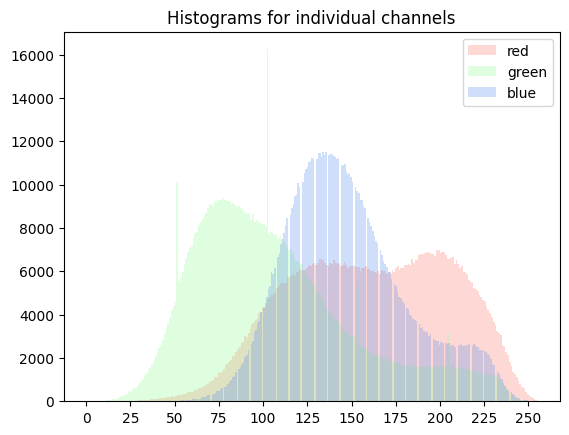

In [7]:
data_red, data_green, data_blue = extract_rgb_channels(img_he)
plt.hist((data_red).flatten(),bins=250,color='salmon',label='red',alpha=0.3)
plt.hist((data_green).flatten(),bins=250,color='palegreen',label='green',alpha=0.3)
plt.hist((data_blue).flatten(),bins=250,color='cornflowerblue',label='blue',alpha=0.3)
plt.legend()
plt.title("Histograms for individual channels")
plt.xticks(np.arange(11)*25)
plt.show()

In [8]:
def apply_rgb_threshold(img):
    """
    Apply threshold to input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract RGB channels
    data_red, data_green, data_blue = extract_rgb_channels(img=img)
    
    # ------------------
    threshold_red = 160
    threshold_blue = 180
    threshold_green = 175
    img_th[np.where(data_green<threshold_green)] = 1 #first segment out grey/white by picking pixels with low green
    img_th[np.where(data_red>threshold_red)] = 0 #of these, select only pixels with high red
    img_th[np.where(data_blue>threshold_blue)] = 0 #apply another condition to choose pixels with high blue
    # ------------------
    
    return  img_th

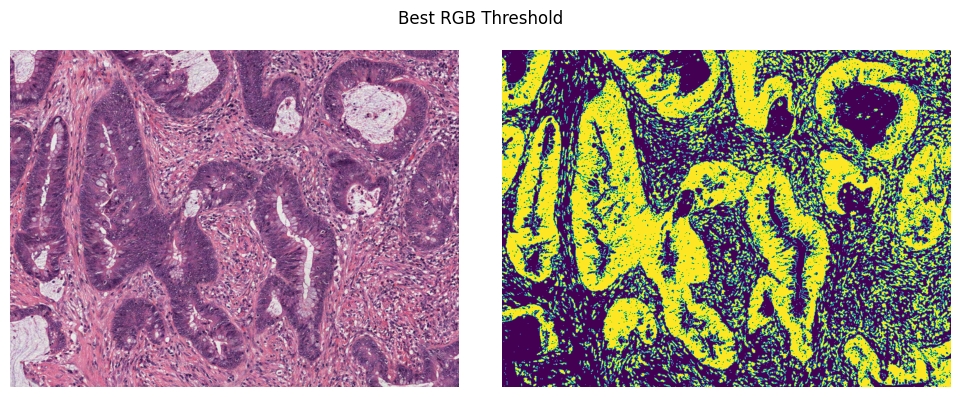

In [10]:
################################################################
############################ TEST ##############################
################################################################

# Plot best RGB thresholding
plot_thresholded_image(img=img_he, func=apply_rgb_threshold, title="Best RGB Threshold")

## Part 1.2 - Other colorspaces (3 pts)

So far we used the standard RGB colorspace to apply our thresholding. In this section, you will convert the image to a different color space. 

* **Q1 (1 pts)**: Use the function `rgb2hsv` from the skimage package ([see doc](https://scikit-image.org/docs/stable/auto_examples/color_exposure/plot_rgb_to_hsv.html)) to convert the input image from RGB to HSV in function `extract_hsv_channels`.
* **Q2 (1 pts)**: Can you see any difference between the use of the RGB or HSV space? (justify)
    * **Answer**: Yes, we can observe that the HSV representation of the image utilises a subset of the cylindrical space whereas the RGB representation can be seen as utilising a large portion of the Cartesian space. Specifically, the histograms show that most of the hue in the image are concentrated near 0.7 to 1.0. The saturation on the other hand is concentrated in a narrower range for smaller hues and a broad range for larger hues. We can already segment out the grey pixels using just the saturation channel as these have lower saturation. In addition, we see a more evident clustering of points in the small range of low value, lower hue and higher saturation. These indicate the purple pixels as they have a small value (darker pixels) and high saturation.

In [11]:
def extract_hsv_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # Define default values for HSV channels
    data_h = np.zeros((M, N))
    data_s = np.zeros((M, N))
    data_v = np.zeros((M, N))

    # ------------------
    hsv_img = rgb2hsv(img)
    data_h = hsv_img[:,:,0]
    data_s = hsv_img[:,:,1]
    data_v = hsv_img[:,:,2]
    # ------------------
    
    return data_h, data_s, data_v

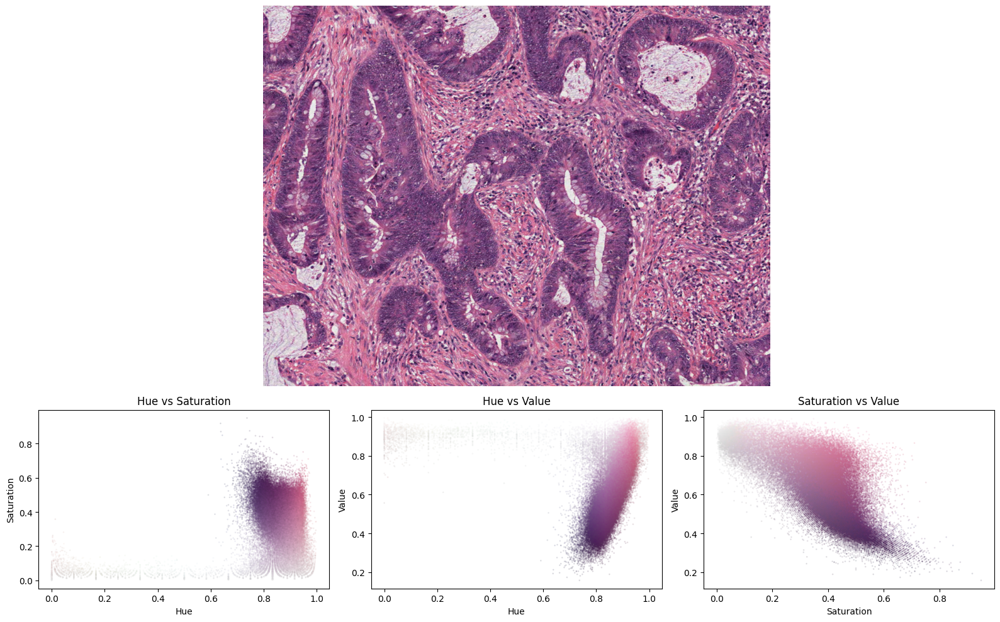

In [12]:
################################################################
############################ TEST ##############################
################################################################

# Call plotting function with your implemented function
plot_colors_histo(
    img = img_he,
    func = extract_hsv_channels,
    labels = ["Hue", "Saturation", "Value"],
)

* **Q3 (1 pts)**: Based on your results, try again to find the best manual threshold in function `apply_hsv_threshold`. Do you think your estimation is reliable? (justify)
    * **Answer**: As described in Q2, we first segment out the pixels with a low saturation as these are the grey pixels. Looking at the histograms above we can directly pick a threshold of 0.2 for saturation and keep only the pixels with a higher saturation than this. Next, in order to segment out the pink pixels we discard the pixels with a value higher than 0.6. This threshold is selected by observing the hue vs value histogram where we can see a clustering of points near the small hue and small value range. If we observe the result at this point, we can already see the tumor cells. However, we add an additional thresholding for the hue channel based on the same cluster observed in the above plots.
    This estimation is relatively more reliable than the RGB based manual thresholding as it only relies on the understanding of the HSV space and the relative qualitatve aspects of different kinds of pixels in the image. This method is more generalizable in the case where the range of hues is different for the pixels in a different image, as we predominanlty rely on the saturation and the value to segment the purple tumor cells. 

In [13]:
def apply_hsv_threshold(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract HSV channels
    data_h, data_s, data_v = extract_hsv_channels(img=img)
    
    # ------------------
    threshold_h = 0.9
    threshold_s = 0.2
    threshold_v = 0.6
    img_th[np.where(data_s>threshold_s)] = 1
    img_th[np.where(data_v>threshold_v)] = 0
    img_th[np.where(data_h>threshold_h)] = 0
    # ------------------
    
    return  img_th

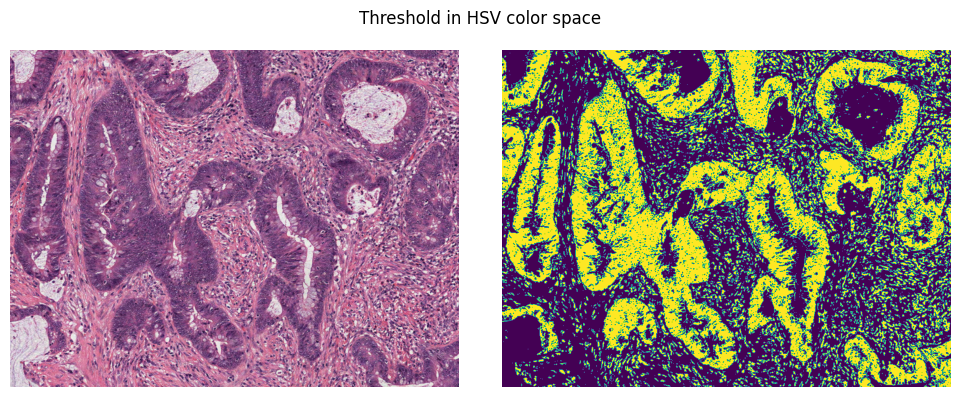

In [14]:
################################################################
############################ TEST ##############################
################################################################

# Find threshold(s) in the hsv channels
img_th=apply_hsv_threshold(img_he)
plot_thresholded_image(img=img_he, func=apply_hsv_threshold, title="Threshold in HSV color space")

## Part 1.3 - Morphology (5 pts)

To proceed, we will use your results from the previous thresholding (namely `apply_hsv_threshold`) as the starting point. In this exercise, we will try to clean the masked images using morphology to get a better estimation of the tumor area.

* **Q1 (1 pts)**: Implement the functions `apply_closing` and `apply_opening` with operations `closing` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing)), `opening` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening)) using the disk sizes arguments ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk)).
* **Q2 (1 pts)**: We test disk sizes: $1, 2, 5, 10$. Comment on the quality of the results.
    * **Answer**: As the disk_size value increases, the impact of the closing operation on the image becomes stronger. At disk_size 1, the effect is minimal, with good preservation of details, but noise and small gaps are not effectively removed. At disk_size 2, there is a balance between details and structure, with small gaps starting to fill and noise slightly reduced. At disk_size 5, noise is significantly reduced, and smaller structures begin to merge, but some details are lost. At disk_size 10, noise and gaps are greatly reduced, but most details are lost, and the image becomes smoother. The overall trend is that as disk_size increases, noise removal and gap filling improve, but detail loss becomes more significant.
    The impact of the opening operation on a binary image intensifies with increasing disk size. At disk size 1, the effect is minimal, preserving details but failing to effectively remove noise and gaps. By disk size 2, there is a noticeable balance between detail preservation and noise reduction. At disk size 5, significant noise reduction and structure merging occur, though some details are lost. At disk size 10, most details are lost as noise and gaps are greatly reduced, resulting in a smoother image. Thus, larger disk sizes enhance gap filling but at the cost of losing finer details.

In [15]:
def apply_closing(img_th, disk_size):
    """
    Apply closing to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_closing: np.ndarray (M, N)
        Image after closing operation
    """

    # Define default value for output image
    img_closing = np.zeros_like(img_th)

    # ------------------
    # Your code here ... 
    selem = disk(disk_size)
    img_closing = closing(img_th, selem)
    # ------------------

    return img_closing


def apply_opening(img_th, disk_size):
    """
    Apply opening to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_opening: np.ndarray (M, N)
        Image after opening operation
    """

    # Define default value for output image
    img_opening = np.zeros_like(img_th)

    # ------------------
    # Your code here ... 
    selem = disk(disk_size)
    img_opening = opening(img_th, selem)
    # ------------------

    return img_opening


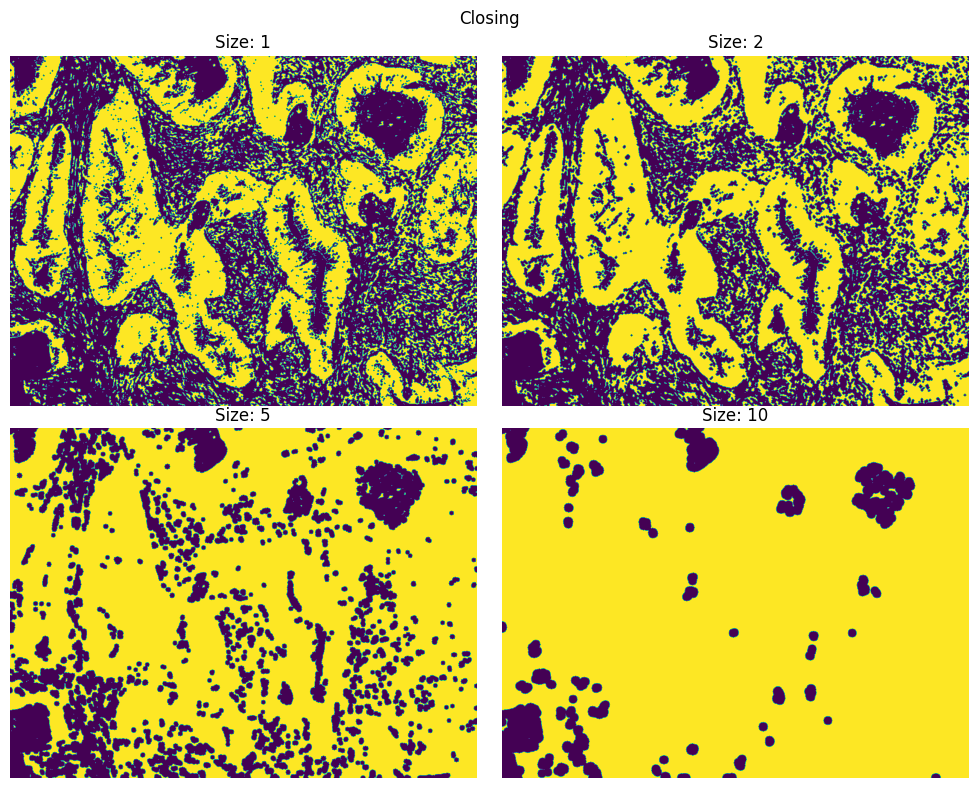

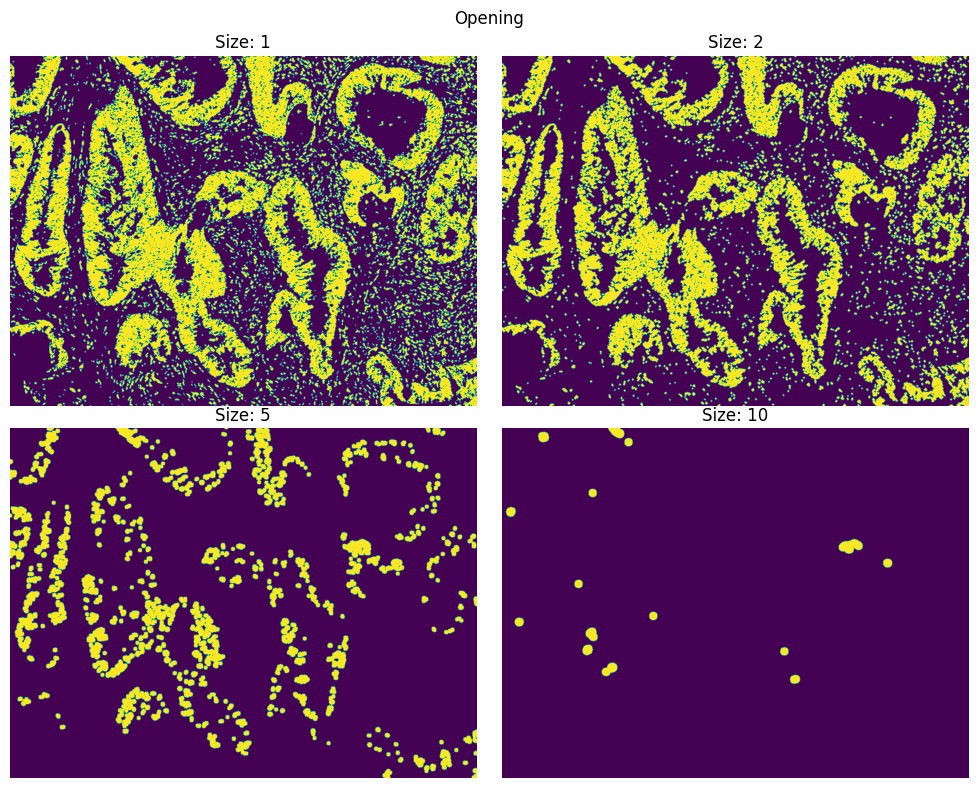

In [47]:
################################################################
############################ TEST ##############################
################################################################

plot_close_open(img_th, apply_closing, apply_opening)

* **Q3 (1 pts)** Implement the functions `remove_holes` and `remove_objects` using operations [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) from skimage package, respectively.
* **Q4 (1 pts)** We test the functions using area sizes: $10, 50, 100$, and $500$. Comment on the quality of the results.
    * **Answer**: For the remove_holes function, at size 10, small holes are filled with minimal impact on details. By size 50, more holes are removed but some small features start to disappear. At size 100, nearly all small holes are filled, leading to significant detail loss. Finally, at size 500, the image becomes very smooth as almost all details are removed, leaving only the largest structures. This illustrates that larger disk sizes are more effective at hole removal but result in a substantial loss of image details.  
    For the remove_objects function, at size 10, the removal is minimal, preserving most of the image's complexity. By size 50, more small objects are cleared, reducing clutter while keeping larger structures intact. At size 100, the image becomes cleaner as further small objects are removed, though some details are lost. By size 500, nearly all small objects are eliminated, leaving only the largest structures and greatly simplifying the image. As disk size increases, the effectiveness in clearing small objects enhances but results in a loss of finer details.

In [24]:
def remove_holes(img_th, size):
    """
    Remove holes from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of holes

    Return
    ------
    img_holes: np.ndarray (M, N)
        Image after remove holes operation
    """

    # Define default value for input image
    img_holes = np.zeros_like(img_th)

    # ------------------
    # Your code here ... 
    # ------------------
    img_th_bool = img_th.astype(bool)
    img_holes_bool = remove_small_holes(img_th_bool, area_threshold=size)
    img_holes = img_holes_bool.astype(np.uint8)

    return img_holes


def remove_objects(img_th, size):
    """
    Remove objects from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of objects

    Return
    ------
    img_obj: np.ndarray (M, N)
        Image after remove small objects operation
    """

    # Define default value for input image
    img_obj = np.zeros_like(img_th)

    # ------------------
    # Your code here ... 
    # ------------------
    img_th_bool = img_th.astype(bool)
    img_obj_bool = remove_small_objects(img_th_bool, min_size=size)
    img_obj = img_obj_bool.astype(np.uint8)

    return img_obj


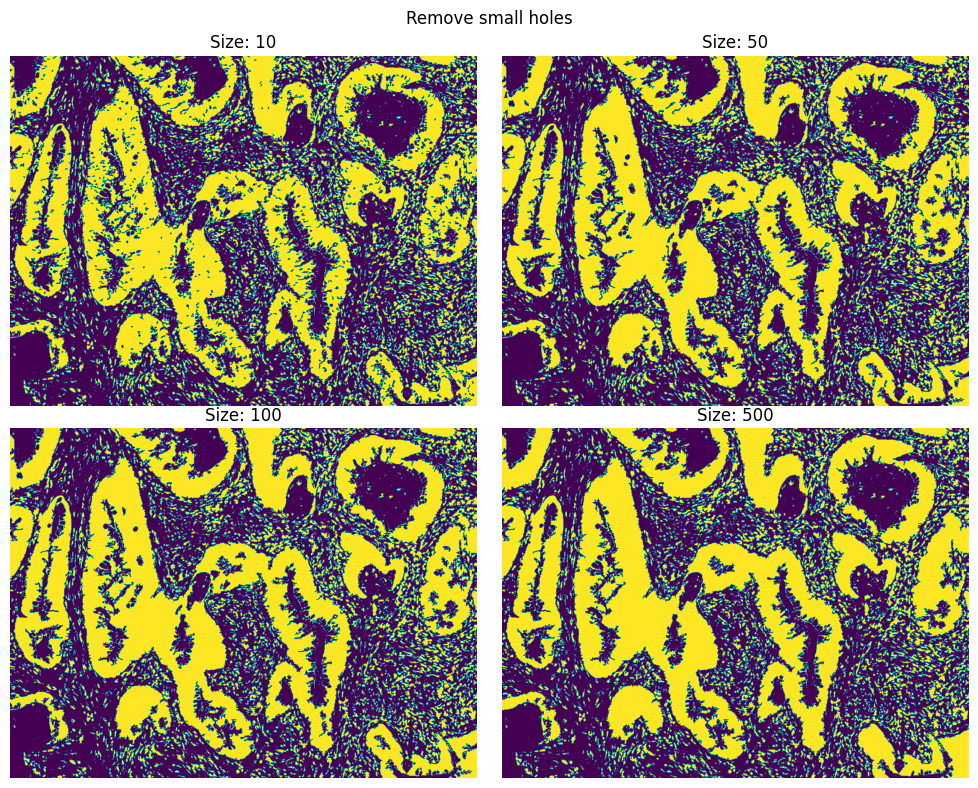

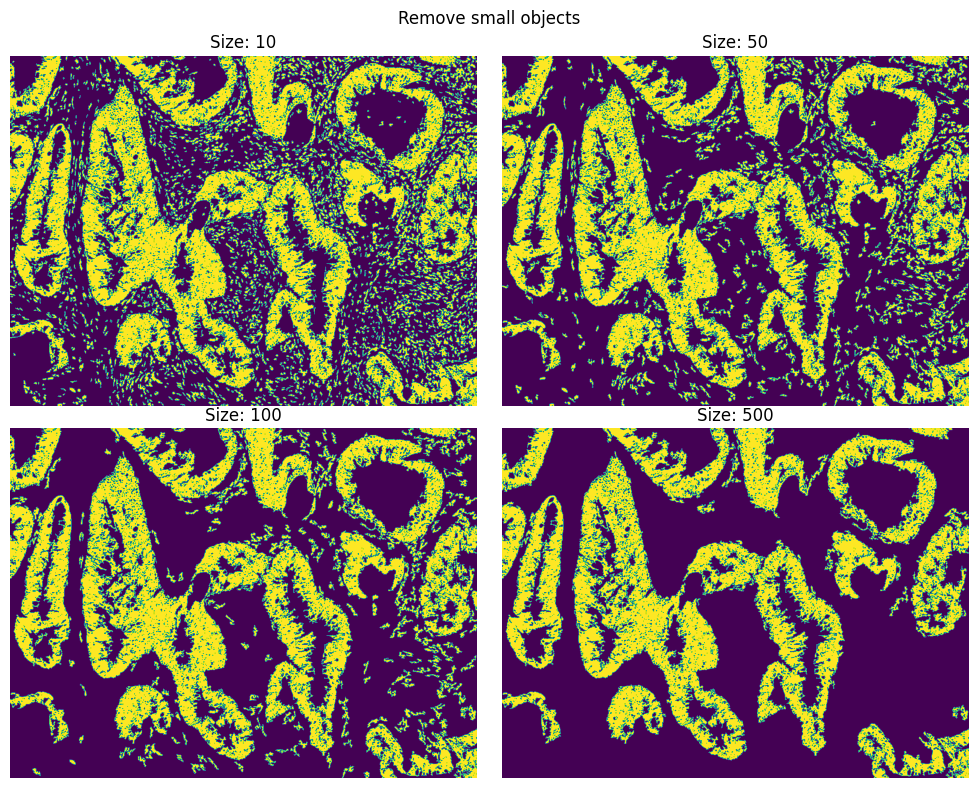

In [25]:
################################################################
############################ TEST ##############################
################################################################

plot_remove_holes_objects(img_th, remove_holes, remove_objects)

* **Q5 (1 pts)** Based on your previous results, implement the function `apply_morphology` that combines morphology functions to improve your tumor detection results from HSV thresholding. In this exercise, we prioritize having a higher number of false positives rather than false negatives, as mistakenly labeling non-tumor regions as tumors (over-segmentation) is preferable to missing actual tumor regions, which could lead to undetected cancerous areas and delayed treatment.

In [19]:
def apply_morphology(img_th):
    """
    Apply morphology to thresholded image

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.

    Return
    ------
    img_morph: np.ndarray (M, N)
        Image after morphological operations
    """

    img_morph = np.zeros_like(img_th)
    
    # ------------------
    # Your code here ... 
    # ------------------
    img_1 = remove_objects(img_th, 2500)
    img_morph = remove_holes(img_1, 2500)
    
    
    return img_morph

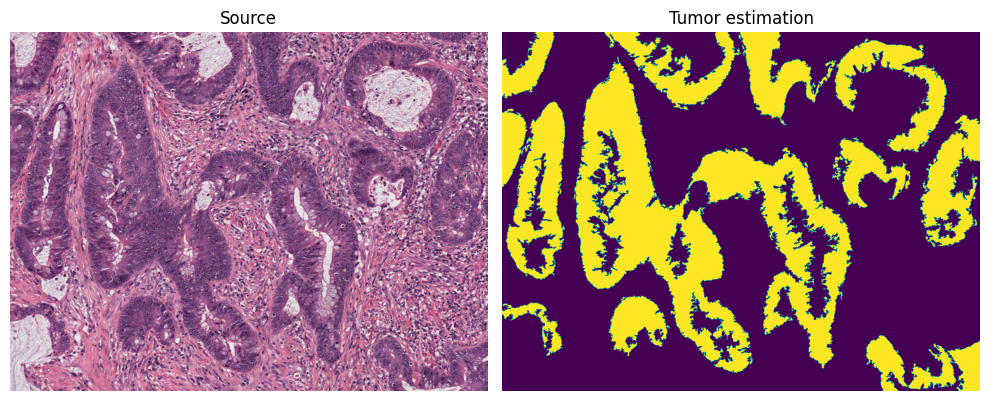

In [20]:
################################################################
############################ TEST ##############################
################################################################

img_best_morpho = apply_morphology(apply_hsv_threshold(img_he))
plot_morphology_best(
    img_source=img_he,
    img_best=img_best_morpho,
)

## Part 1.4 - Region Growing (4 pts)

* **Q1 (3 pts)** In this section we ask you to implement from scratch your own `region_growing` function to detect the tumor area. The function should take as input an RGB image, seeds that are manual initialization points in the tumor area, and the maximum number of iterations to perform. ote that the function also includes the kwargs argument. You can use it to add additional parameters to your function if needed (see [doc kwargs](https://book.pythontips.com/en/latest/args_and_kwargs.html)). Importantly, for timing reasons, a single explicit for loop on iterations is expected. An explicit for loop on pixels or neighbours will be accepted but penalised by 1 point. Use numpy tools to succeed.
* **Q2 (1 pts)** Your function is then used to perform region growing using multiple iterations. Comment on the quality of the results based on the number of iterations performed as well as the running time.
    * **Answer**: ...

As we can see in the set of images below, the quality of region_growing results and running time are influenced by both the number of iterations and the threshold value. 

More specifically, the number of iterations affects segmentation quality and efficiency. With fewer iterations, such as 20, only small, scattered regions are captured, making the process computationally efficient but incomplete. Increasing the iterations to 2000 allows the region to grow more fully, capturing larger areas with better segmentation quality, though at the cost of significantly longer processing time.

We experimented with different threshold levels and found that higher values, such as 140-160, produced faster results by being less strict about pixel inclusion. However, this often led to overly general segmentation, including pixels that were not part of the tumour. In contrast, lower thresholds like 120, 100, and 80 made the function more selective, resulting in better segmentation but significantly slower performance. Eventually, we found that a threshold of 40 provided a good segmentation result. 



In [ ]:
def region_growing(
    seeds: list[tuple],
    img: np.ndarray,
    n_max: int = 10,
    **kwargs
):
    """
    Run region growing on input image using seed points.

    Args
    ----
    seeds: list of tuple
        List of seed points
    img: np.ndarray (M, N, C)
        RGB image of size M, N, C
    n_max: int
        Number maximum of iterations before stopping algorithm

    Return
    ------
    rg: np.ndarray (M, N)
        Image after region growing has been performed
    """
    
    M, N, _ = img.shape
    rg = np.zeros((M, N)).astype(bool)
    
    # ------------------
    # Your code here ... 
                    
    # Plotting the seeds into our blank rg slate
    for seed in seeds:
        rg[seed] = True

    # How similar a pixel should be to be included in selected region
    threshold = kwargs.get('threshold', 10)

    for _ in range(n_max):

        # Dilating boundary by 1 
        boundary = binary_dilation(rg)
        # Updating the boundary pixels 
        boundary[rg] = False 

        # Calculating mean colour of the current region
        # do neighbours qualify to be part of the tumour region
        region_mean_color = img[rg].mean(axis=0)

        # Calculating colour difference for all boundary pixels
        color_diff = np.linalg.norm(img[boundary] - region_mean_color, axis=1)

        # Adding boundary pixels to the region if they satisfy colour threshold 
        rg[boundary] = color_diff < threshold

    # ------------------

    return rg


In [ ]:
# Add you additional arguments in the dictionary below
# idk about 40 cause i was playing aorund and it gave decent results (like 120 and 160 sucked, 100 was okay, 80 meh, and 40 was solid) 
# I did not wanna go to high either since RGB has range [0,255] but hmm for discussion when we meet
# But i was reading and saw how in the above, you guys used thresholds like 140 and 160 so uhhhh what.
kwargs = {'threshold': 40}

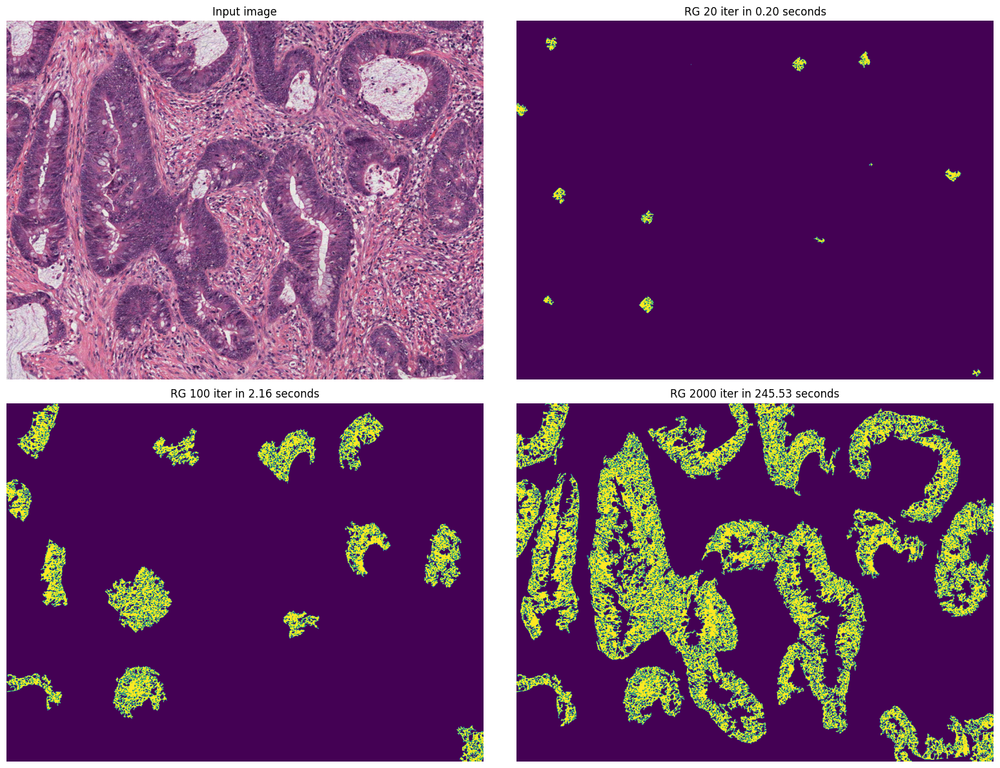

In [50]:
################################################################
############################ TEST ##############################
################################################################

img_grow = plot_tumor_region_growing(img_he, region_growing, **kwargs)

## Part 1.5 - Final Comparison (1 pts)

* **Q1 (1 pts)** Run the cell below. Based on your observation, which approach do you think gives the best estimation of the tumor area? (justify)
    * **Answer**: 

    Unlike the HSV Threshold, which captures large but imprecise regions, and the HSV Threshold + Morphology, which improves segmentation but may still include non-tumor areas, Region Growing offers high precision by iteratively expanding from seed points. This method closely follows the tumor’s structure, resulting in a more detailed and accurate segmentation with minimal inclusion of surrounding tissue. While it is computationally intensive and requires careful parameter selection, its accuracy makes it the strongest choice for precise tumor area estimation.

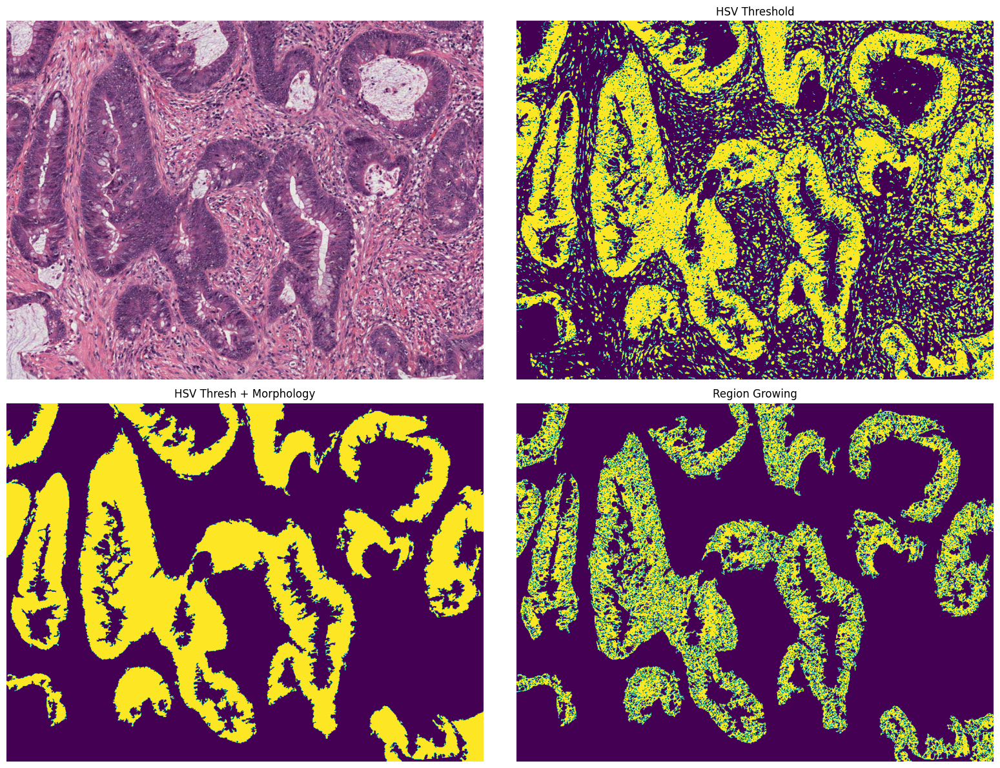

In [51]:
################################################################
############################ TEST ##############################
################################################################

plot_final_comparison(img_he, img_th, img_best_morpho, img_grow)

---
# Part 2 - Sandbox [8 pts]

For the second part, you will work on a new HE case without help. This time we ask you to
* **Q1 (4 pts)**: detect and compute the area of the blood cells,
* **Q2 (4 pts)**: detect and compute the area of the mucin.

Provide your results to the function `plot_results`. See the example below. Be careful, the completely white area is not mucin. It is the slide background and should be discarded. Moreover, you can focus on the large blood cell aggregates (large red areas)

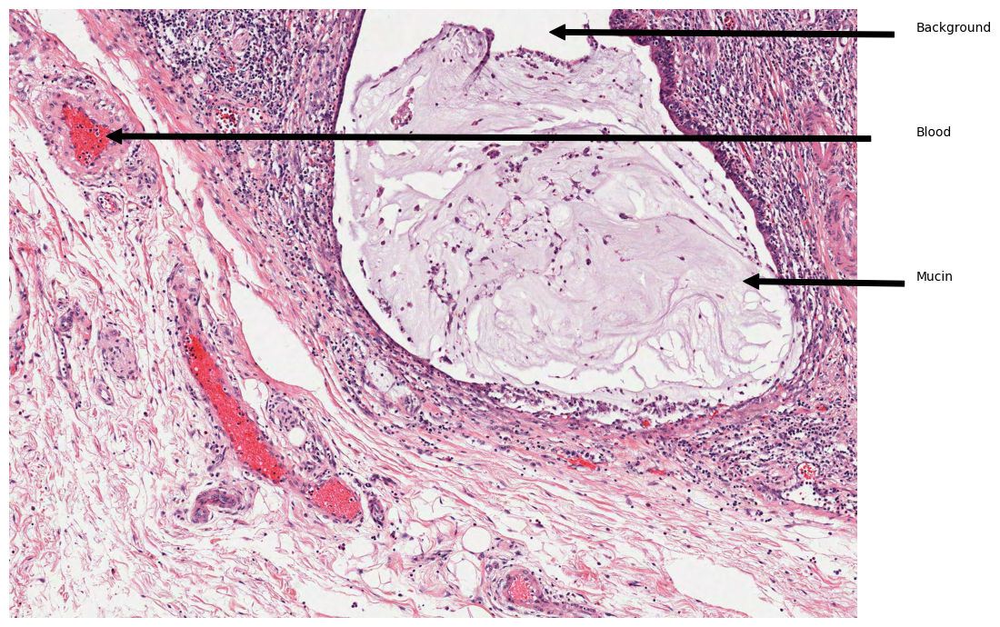

In [23]:
img_he2 = show_exo2_figure()

In [24]:
M, N, C = np.shape(img_he2)
mask_blood = np.zeros((M, N))
mask_mucin = np.zeros((M, N))

# ------------------
# Your code here ... 
# ------------------

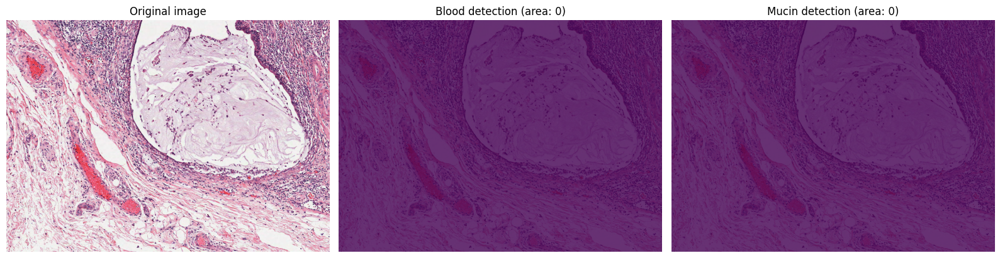

In [25]:
################################################################
############################ TEST ##############################
################################################################

plot_results(img=img_he2, mask_blood=mask_blood, mask_mucin=mask_mucin)